# Sensor Model

## Import lib

In [17]:
import scipy as sp
import numpy as np

matplotlib.style.use('default')
from numpy import loadtxt, gradient
from matplotlib.pyplot import subplots, show
import matplotlib.pyplot as plt

import Model.IR_model as mm

## Import Data

Text(0.5, 1.0, 'Sonar2')

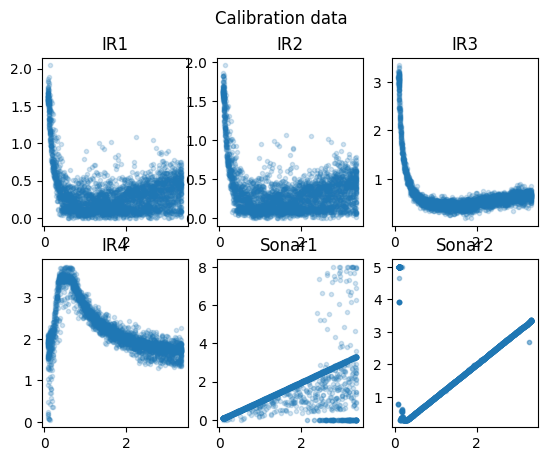

In [18]:
# Load data
filename = 'partA/calibration.csv'
data = np.loadtxt(filename, delimiter=',', skiprows=1)

# Split into columns
index, time, distance, velocity_command, raw_ir1, raw_ir2, raw_ir3, raw_ir4, \
    sonar1, sonar2 = data.T


fig, axes = plt.subplots(2, 3)
fig.suptitle('Calibration data')

axes[0, 0].plot(distance, raw_ir1, '.', alpha=0.2)
axes[0, 0].set_title('IR1')

axes[0, 1].plot(distance, raw_ir2, '.', alpha=0.2)
axes[0, 1].set_title('IR2')

axes[0, 2].plot(distance, raw_ir3, '.', alpha=0.2)
axes[0, 2].set_title('IR3')

axes[1, 0].plot(distance, raw_ir4, '.', alpha=0.2)
axes[1, 0].set_title('IR4')

axes[1, 1].plot(distance, sonar1, '.', alpha=0.2)
axes[1, 1].set_title('Sonar1')

axes[1, 2].plot(distance, sonar2, '.', alpha=0.2)
axes[1, 2].set_title('Sonar2')

## IR1 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


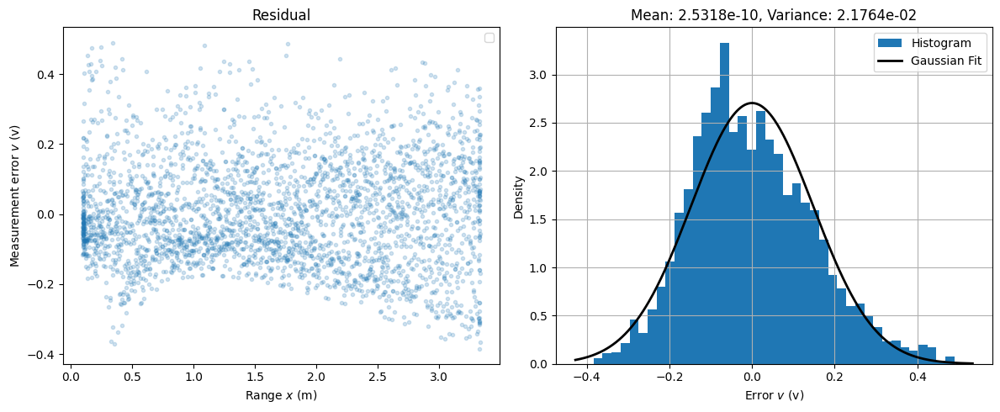

In [19]:
ir1_x_no_outlier, ir1_v_no_outlier,ir1_fit,ir1_params= mm.remove_outlier(mm.ir3_model,distance,raw_ir1)
err_ir1 = ir1_v_no_outlier - ir1_fit 
# mm.plot_fit_line(ir1_x_no_outlier,ir1_v_no_outlier,ir1_fit,"IR1")
mm.Residual_and_Histogram(ir1_x_no_outlier,ir1_v_no_outlier,ir1_fit)


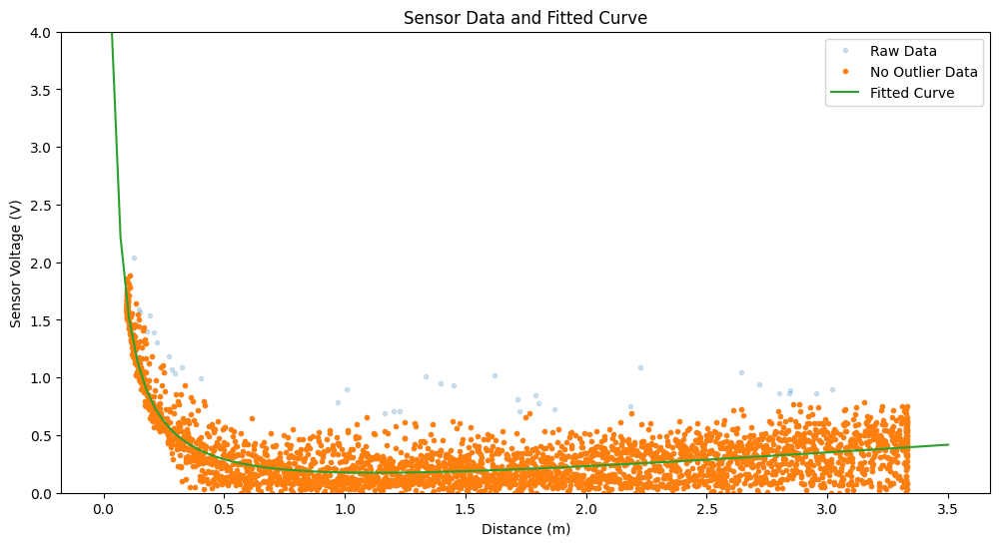

In [20]:
ir1_params, cov = sp.optimize.curve_fit(mm.ir3_model, ir1_x_no_outlier, ir1_fit)
filtered_fit = mm.ir3_model(ir1_x_no_outlier, *ir1_params)
# print(filtered_params)
# Extract parameters from the IR3 sensor fitting
a1_ir1 = ir1_params[0]
a2_ir1 = ir1_params[1]
b_ir1 = ir1_params[2]
c_ir1 = ir1_params[3]

# Define a lambda function h_ir3 for further calculations
h_ir1 = lambda x: a1_ir1 / (x + a2_ir1) + b_ir1 * x + c_ir1

mm.plot_sonar_data_and_model(distance,raw_ir1,ir1_x_no_outlier,ir1_v_no_outlier,h_ir1)

Err_ir1 = mm.calculate_ERR(distance,raw_ir1,h_ir1)


# xlim([0.1,3])

## IR2 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


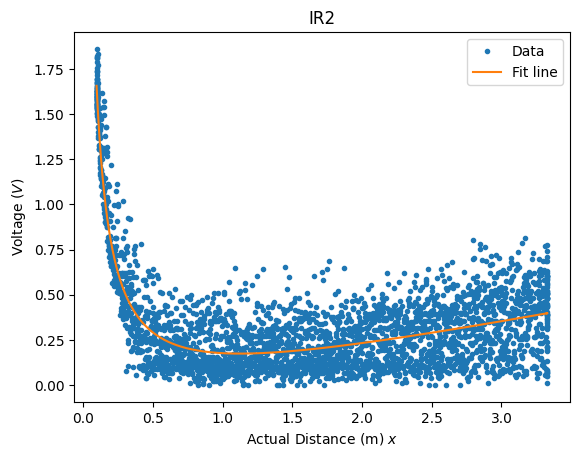

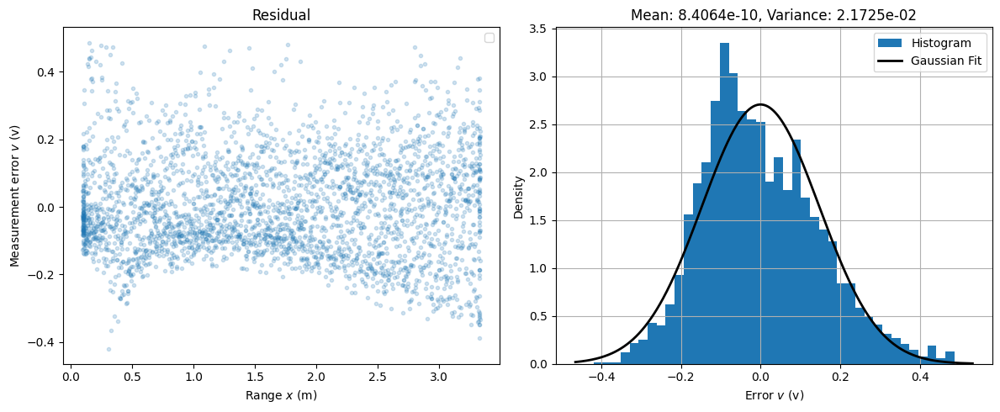

In [21]:
ir2_x_no_outlier, ir2_v_no_outlier,ir2_fit,ir2_params= mm.remove_outlier(mm.ir3_model,distance,raw_ir2)

err_ir2 = ir2_v_no_outlier - ir2_fit 
mm.plot_fit_line(ir2_x_no_outlier,ir2_v_no_outlier,ir2_fit,"IR2")
mm.Residual_and_Histogram(ir2_x_no_outlier,ir2_v_no_outlier,ir2_fit)
# print(Var_X_ir2)

[ 0.20011241  0.01324821  0.15411281 -0.17562547]


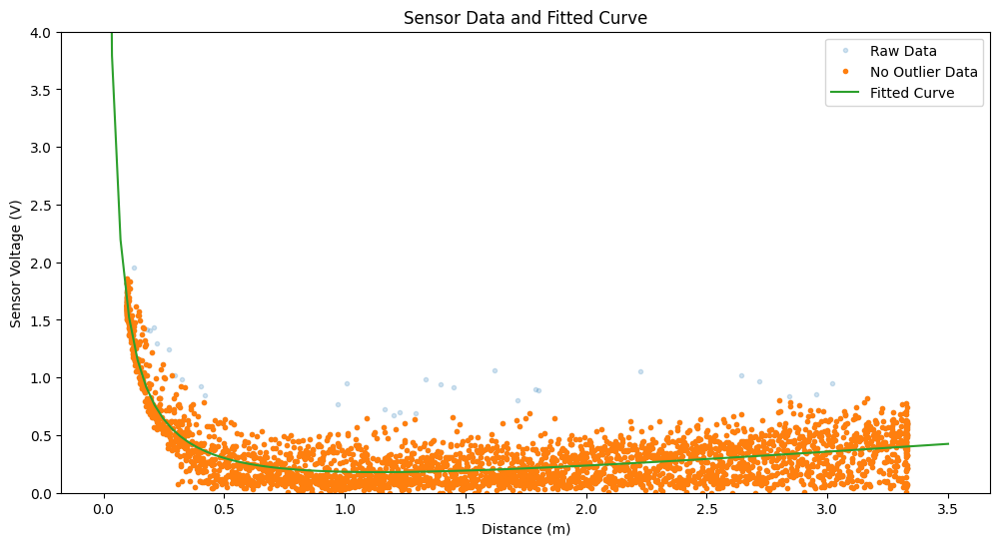

In [22]:
# Fit the filtered data using the sn1_model and optimize.curve_fit
filtered_params, cov = sp.optimize.curve_fit(mm.ir3_model, ir2_x_no_outlier, ir2_fit)
filtered_fit = mm.ir3_model(ir2_x_no_outlier, *filtered_params)
print(filtered_params)

# Extract parameters from the fitted model
a1_ir2 = ir2_params[0]
a2_ir2 = ir2_params[1]
b_ir2 = ir2_params[2]
c_ir2 = ir2_params[3]


h_ir2 = lambda x: a1_ir2 / (x + a2_ir2) + b_ir2 * x + c_ir2

# check_distance_ir3 = distance[100:]
# check_raw_ir3 = raw_ir3[100:]
mm.plot_sonar_data_and_model(distance,raw_ir2,ir2_x_no_outlier,ir2_v_no_outlier,h_ir2)


Err_ir2 = mm.calculate_ERR(distance,raw_ir2,h_ir2)

## IR3

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


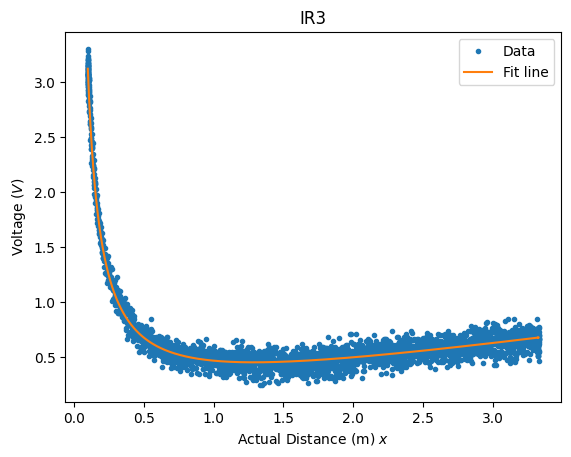

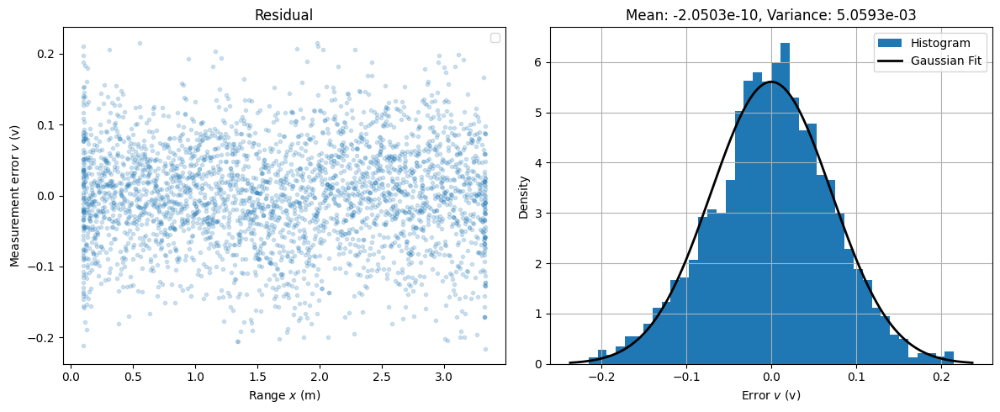

In [23]:
ir3_x_no_outlier, ir3_v_no_outlier,ir3_fit,ir3_params= mm.remove_outlier(mm.ir3_model,distance,raw_ir3)

err_ir3 = ir3_v_no_outlier - ir3_fit 
mm.plot_fit_line(ir3_x_no_outlier,ir3_v_no_outlier,ir3_fit,"IR3")
mm.Residual_and_Histogram(ir3_x_no_outlier,ir3_v_no_outlier,ir3_fit)


[ 0.29657816 -0.00154828  0.17957575 -0.00701236]


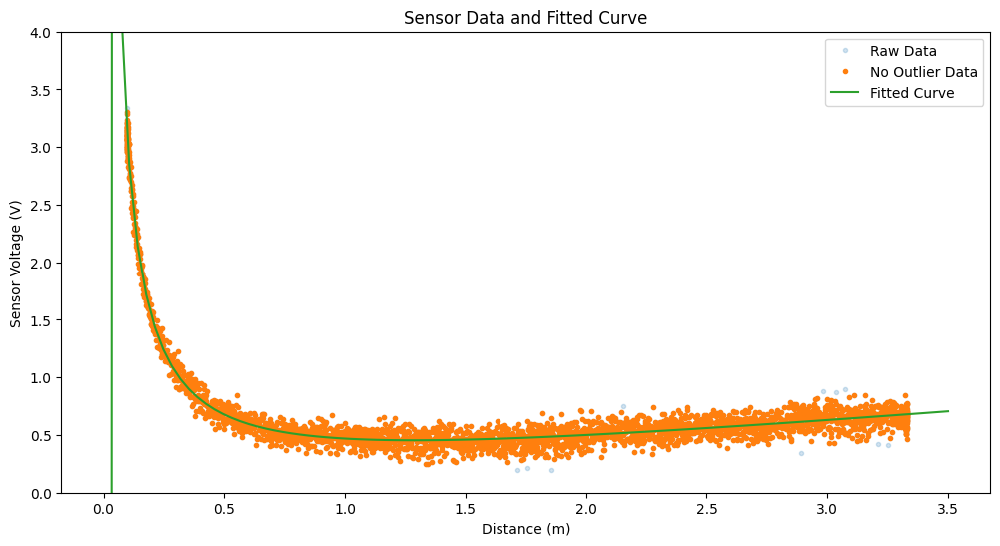

In [24]:
# Fit the filtered data using the sn1_model and optimize.curve_fit
filtered_params, cov = sp.optimize.curve_fit(mm.ir3_model, ir3_x_no_outlier, ir3_fit)
filtered_fit = mm.ir3_model(ir3_x_no_outlier, *filtered_params)
print(filtered_params)

# Extract parameters from the fitted model
a1_ir3 = ir3_params[0]
a2_ir3 = ir3_params[1]
b_ir3 = ir3_params[2]
c_ir3 = ir3_params[3]


h_ir3 = lambda x: a1_ir3 / (x + a2_ir3) + b_ir3 * x + c_ir3

# check_distance_ir3 = distance[100:]
# check_raw_ir3 = raw_ir3[100:]
mm.plot_sonar_data_and_model(distance,raw_ir3,ir3_x_no_outlier,ir3_v_no_outlier,h_ir3)


Err_sn1 = mm.calculate_ERR(distance,raw_ir3,h_ir3)

## IR4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


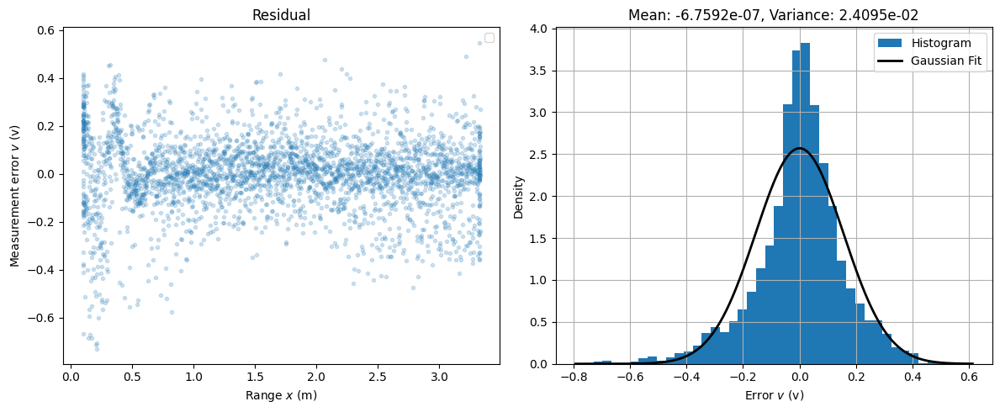

In [34]:
ir4_x_no_outlier, ir4_v_no_outlier,ir4_fit,ir4_params= mm.remove_outlier(mm.ir4_model,distance,raw_ir4)

err_ir4 = ir4_v_no_outlier - ir4_fit 
# mm.plot_fit_line(ir4_x_no_outlier,ir4_v_no_outlier,ir4_fit,"IR4")
mm.Residual_and_Histogram(ir4_x_no_outlier,ir4_v_no_outlier,ir4_fit)


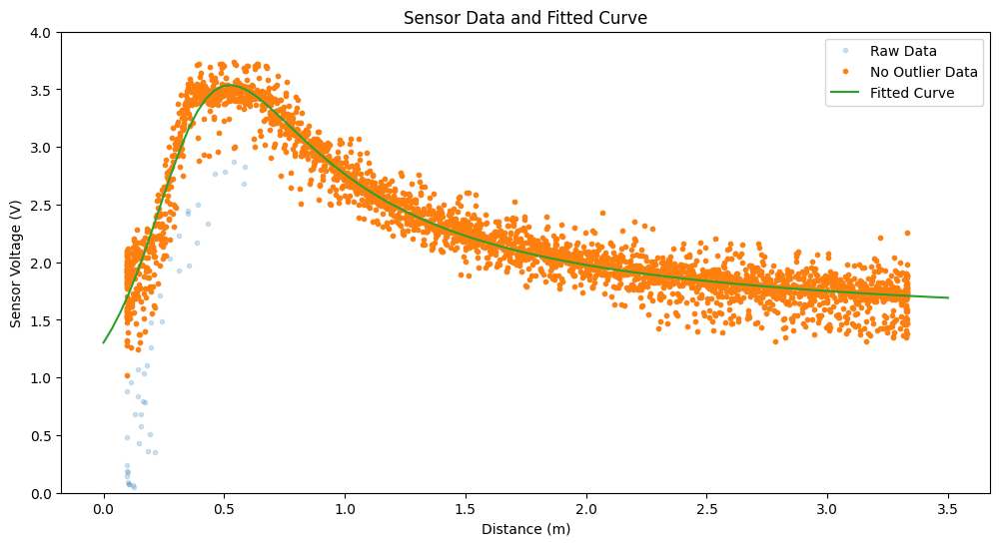

In [26]:
# Remove outliers for IR4 sensor
ir4_params, cov = sp.optimize.curve_fit(mm.ir4_model, ir4_x_no_outlier, ir4_fit)
# filtered_fit = mm.ir4_model(ir2_x_no_outlier, *filtered_params)
# ir4_x, ir4_v, ir4_fit, ir4_params = mm.remove_outlier(mm.ir4_model, distance, raw_ir4, 3)
# print(ir4_params)

# Extract parameters from the IR4 sensor model
a1_ir4 = ir4_params[0]
b1_ir4 = ir4_params[1]
a2_ir4 = ir4_params[2]
b2_ir4 = ir4_params[3]
c1_ir4 = ir4_params[4]
c2_ir4 = ir4_params[5]
d1_ir4 = ir4_params[6]
d2_ir4 = ir4_params[7]
e1_ir4 = ir4_params[8]
e2_ir4 = ir4_params[9]
f_ir4 = ir4_params[10]

# Define a function h_ir4 based on the extracted parameters
h_ir4 = lambda x: (a1_ir4*(x+d1_ir4)**2 + b1_ir4*(x+e1_ir4) + c1_ir4) / (a2_ir4*(x+d2_ir4)**2 + b2_ir4*(x+e2_ir4) + c2_ir4) + f_ir4
Error_IR4 = h_ir4(distance) - raw_ir4

mm.plot_sonar_data_and_model(distance,raw_ir4,ir4_x_no_outlier,ir4_v_no_outlier,h_ir4)


## SN1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


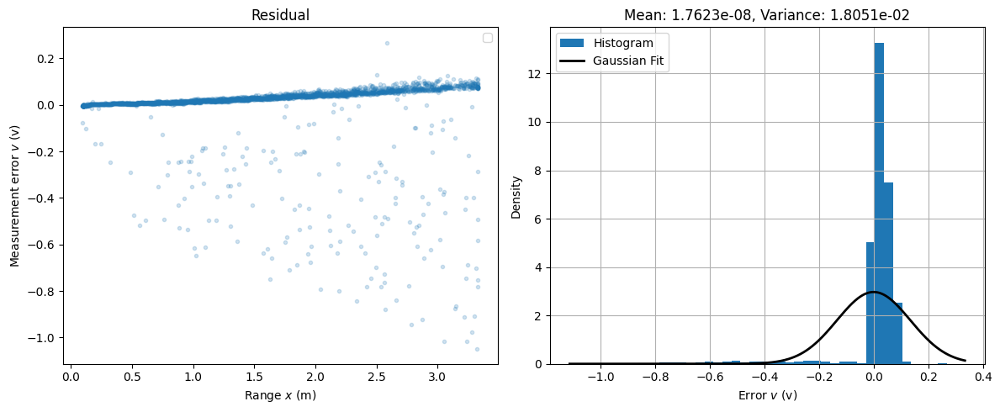

In [27]:
sn1_x_no_outlier, sn1_v_no_outlier,sn1_fit,sn1_params= mm.remove_outlier(mm.sn1_model,distance,sonar1,0.7)

err_sn1 = sn1_v_no_outlier - sn1_fit 
# mm.plot_fit_line(sn1_x_no_outlier,sn1_v_no_outlier,sn1_fit,"SN1")
mm.Residual_and_Histogram(sn1_x_no_outlier,sn1_v_no_outlier,sn1_fit)


[  0.96831386 -21.44384784  20.75565773]


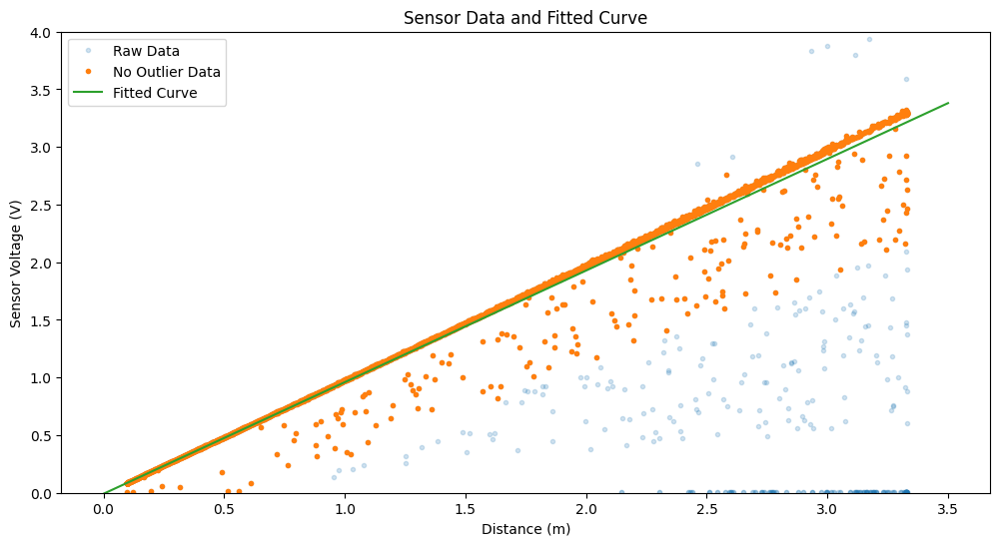

In [28]:
# Define a custom function sn1_model
def sn1_model(x, a, b, c):
    return a * (x + b) + c

# Fit the filtered data using the sn1_model and optimize.curve_fit
filtered_params, cov = sp.optimize.curve_fit(sn1_model, sn1_x_no_outlier, sn1_fit)
filtered_fit = sn1_model(sn1_x_no_outlier, *filtered_params)
print(filtered_params)

# Extract parameters from the fitted model
sn1_a = filtered_params[0]
sn1_b = filtered_params[1]
sn1_c = filtered_params[2]

h_sn1 = lambda x : sn1_a * (x + sn1_b) + sn1_c

mm.plot_sonar_data_and_model(distance,sonar1,sn1_x_no_outlier,sn1_v_no_outlier,h_sn1)


Err_sn1 = mm.calculate_ERR(distance,sonar1,h_sn1)

## SN2

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


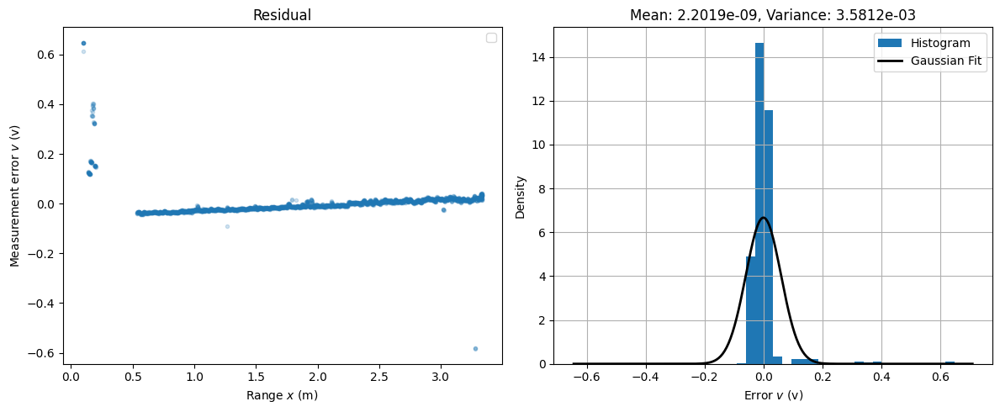

In [29]:
sn2_x_no_outlier, sn2_v_no_outlier,sn2_fit,sn2_params= mm.remove_outlier(mm.sn1_model,distance,sonar2,0.7)

err_sn2 = sn2_v_no_outlier - sn2_fit 
# mm.plot_fit_line(sn2_x_no_outlier,sn2_v_no_outlier,sn2_fit,"SN2")
mm.Residual_and_Histogram(sn2_x_no_outlier,sn2_v_no_outlier,sn2_fit)

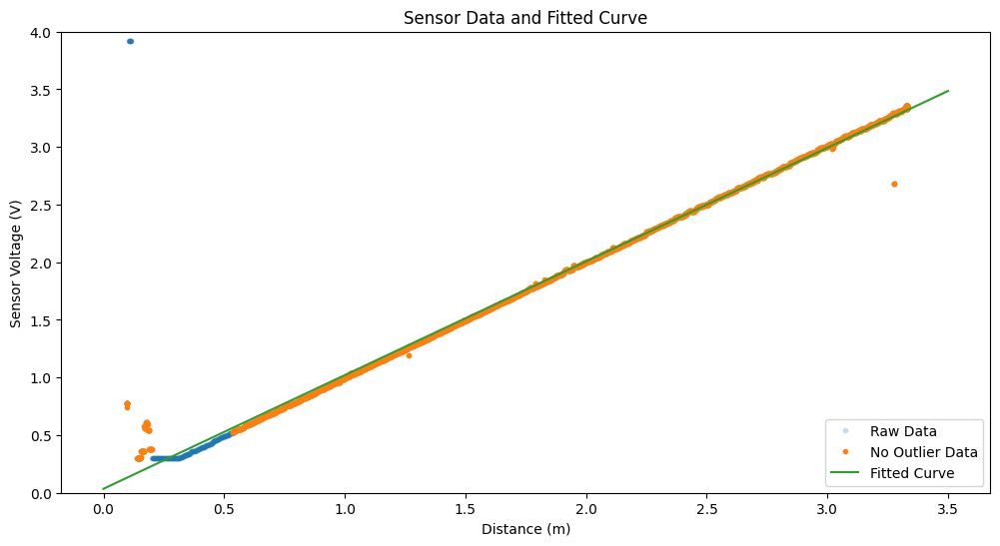

In [30]:

filtered_params, cov = sp.optimize.curve_fit(mm.sn1_model, sn2_x_no_outlier, sn2_fit)
filtered_fit = mm.sn1_model(sn2_x_no_outlier, *filtered_params)
# print(filtered_params)


# Extract parameters from the fitted model
sn2_a = filtered_params[0]
sn2_b = filtered_params[1]
sn2_c = filtered_params[2]

h_sn2 = lambda x : sn2_a * (x + sn2_b) + sn2_c

mm.plot_sonar_data_and_model(distance,sonar2,sn2_x_no_outlier,sn2_v_no_outlier,h_sn2)


Err_sn2 = mm.calculate_ERR(distance,sonar2,h_sn2)



IR3 

# Likelihood

### Var Look Up Table

In [44]:
# create var lookup table for each sensor

ir1_x_segments, Var_LUT_ir1 = mm.CreateVariancesLUT(ir1_x_no_outlier, err_ir1, 0.1)
ir2_x_segments, Var_LUT_ir2 = mm.CreateVariancesLUT(ir2_x_no_outlier, err_ir2, 0.1)
ir3_x_segments, Var_LUT_ir3 = mm.CreateVariancesLUT(ir3_x_no_outlier, err_ir3, 0.1)

ir4_x_segments, Var_LUT_ir4 = mm.CreateVariancesLUT(ir4_x_no_outlier, err_ir4, 0.1)
sn1_x_segments, Var_LUT_sn1 = mm.CreateVariancesLUT(sn1_x_no_outlier, err_sn1, 0.1)
sn2_x_segments, Var_LUT_sn2 = mm.CreateVariancesLUT(sn2_x_no_outlier, err_sn2, 0.1)



In [77]:
import numpy as np

# Function to calculate the derivative of a given function 'func' at point 'x'
def calculate_derivative(func, x):
    # Small increment for numerical differentiation
    dx = 0.001
    return (func(x + dx) - func(x)) / dx

# Function to invert 'sensor_model' to find 'curguess' such that 'sensor_model(curguess)' is close to 'z'
def invert_sensor_model(sensor_model, target_value, search_range=(0, 10)):
    # Calculate the initial half range
    half_range = (search_range[1] - search_range[0]) / 2
    # Initial guess in the middle of the search range
    curguess = (search_range[1] + search_range[0]) / 2
    iteration = 0
    max_iterations = 1000
    
    while (np.abs(sensor_model(curguess) - target_value) > 0.0001 and iteration < max_iterations):
        iteration += 1
        current_output = sensor_model(curguess)
        
        # Adjust the guess based on the sign of the derivative
        if current_output > target_value:
            if calculate_derivative(sensor_model, curguess) > 0:  # Positive slope
                curguess -= half_range / 2
            else:
                curguess += half_range / 2
        else:
            if calculate_derivative(sensor_model, curguess) > 0:  # Positive slope
                curguess += half_range / 2
            else:
                curguess -= half_range / 2
        half_range /= 2

    if np.abs(sensor_model(curguess) - target_value) > 0.0001:
        return None
    else:
        return curguess

# # Function to find two guesses using 'invert_sensor_model' within specified range 'search_range'
# def find_two_guesses(sensor_model, target_value, midpoint, search_range=(0, 4)):
#     guess_left = invert_sensor_model(sensor_model, target_value, search_range=(search_range[0], midpoint))
#     guess_right = invert_sensor_model(sensor_model, target_value, search_range=(midpoint, search_range[1]))
#     return guess_left, guess_right


In [78]:
# from scipy import stats
# gPoint2, gPoint1 = amb_H_invert(H_sensor_model, Vol_z, mid=1)
g_sn1 = invert_sensor_model(h_sn1, 1, search_range=(0, 4))
print(g_sn1)

# def find_std_index(value, intervals):
#     if value < intervals[0]:
#         return 0
#     if value >= intervals[-1]:
#         return len(intervals) - 1
#     for i in range(len(intervals) - 1):
#         if value >= intervals[i] and value < intervals[i ]:
#             return i
#     return -1  # 如果值不在任何区间内，则返回-1


# g_sn1_Point_index = find_std_index(g_sn1, Xaxis_sn1)
# g_sn1_var = Var_LUT_sn1



# Debug section
# if not g_sn1 is None:
#     L_sn1 = stats.norm.pdf(x_values, loc=g_sn1, scale=(g_sn1_Point_std)**2)
#     print(f"ir4 1 guess {g_sn1}")
#     sn1Plot = plt.plot(x_values, L_sn1)
# else:
#     sn1Plot = plt.plot()


# print(g_sn1_Point_std)
# print(g_sn1_Point_index)

1.041748046875


# 开发

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


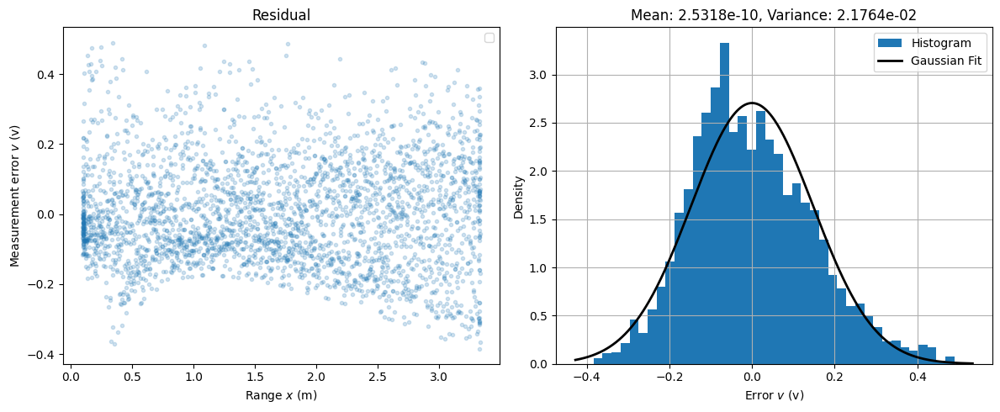

In [ ]:







mm.Residual_and_Histogram( ir1_x_no_outlier, ir1_v_no_outlier,ir1_fit)


In [ ]:
import numpy as np

def H_invert(sensor_model, target_value, search_range=(0, 10)):
    """
    使用二分搜索反演传感器模型以找到输入值，使传感器输出接近目标值。

    Parameters:
        sensor_model (function): 表示传感器模型的函数，接受输入值并返回传感器输出值。
        target_value (float): 目标传感器输出值。
        search_range (tuple): 搜索范围的起始和结束值。

    Returns:
        float or None: 找到的输入值，使传感器输出接近目标值，如果无法找到则返回None。
    """
    half_range = (search_range[1] - search_range[0]) / 2  # 搜索范围的一半
    current_guess = search_range[1] / 2  # 初始猜测值设为搜索范围的中间位置
    iteration_limit = 1000  # 最大迭代次数，避免无限循环
    
    iteration = 0  # 迭代计数器
    
    while (np.abs(sensor_model(current_guess) - target_value) > 0.0001 and iteration < iteration_limit):
        iteration += 1
        
        current_output = sensor_model(current_guess)  # 当前猜测值的传感器输出
        
        # 根据当前输出与目标值的大小关系来调整猜测值
        if current_output > target_value:
            if slope_positive(sensor_model, current_guess):  # 如果斜率为正
                current_guess -= half_range / 2
            else:
                current_guess += half_range / 2
        else:
            if slope_positive(sensor_model, current_guess):  # 如果斜率为正
                current_guess += half_range / 2
            else:
                current_guess -= half_range / 2
        
        half_range /= 2  # 减小搜索步长
        
    if np.abs(sensor_model(current_guess) - target_value) > 0.0001:
        return None
    else:
        return current_guess

def slope_positive(sensor_model, x):
    """
    判断传感器模型在特定位置的斜率是否为正。

    Parameters:
        sensor_model (function): 表示传感器模型的函数。
        x (float): 输入位置。

    Returns:
        bool: 如果斜率为正则返回True，否则返回False。
    """
    epsilon = 1e-6  # 微小的增量
    slope = (sensor_model(x + epsilon) - sensor_model(x)) / epsilon
    return slope > 0

# 示例用法
def sample_sensor_model(x):
    # 这是一个示例传感器模型函数，你需要替换成实际的传感器模型
    return x**2  # 传感器输出为输入值的平方

target_output = 4.0  # 目标传感器输出值
search_range = (0, 3)  # 搜索范围

result = H_invert(sample_sensor_model, target_output, search_range)
if result is not None:
    print(f"Found input value for target output {target_output}: {result:.4f}")
else:
    print(f"No matching input value found for target output {target_output}.")


Found input value for target output 4.0: 2.0000


In [ ]:
def amb_H_invert(sensor_model, z, mid, scope=(0, 4)):
    """
    使用两次 H_invert 函数来在不同范围内反演传感器模型以找到输入值。

    Parameters:
        sensor_model (function): 表示传感器模型的函数，接受输入值并返回传感器输出值。
        z (float): 目标传感器输出值。
        mid (float): 分割搜索范围的中间值。
        scope (tuple): 搜索范围的起始和结束值。

    Returns:
        tuple: 包含两个输入值的元组 (guess, guess2)，分别在左半边和右半边的范围内找到。
    """
    # 在左半边的范围 (0, mid) 内搜索输入值
    guess = H_invert(sensor_model, z, scope=(0, mid))
    
    # 在右半边的范围 (mid, 4) 内搜索输入值
    guess2 = H_invert(sensor_model, z, scope=(mid, 4))
    
    return guess, guess2

# z= 2.4
# xmin = 0
# xmax = 4

# result = h_inverse(z, xmin, xmax)
# print("Closest x value:", result)
# print("Corresponding h(x) value:", H_INV_sn1(result))

In [ ]:
# g_ir3_1, g_ir3_2= amb_H_invert(h_ir3, raw_ir3[fish], mid=1)

NameError: name 'h_ir3' is not defined

2.4
2.400855541229248
估计电压值为 2.3286875826980307


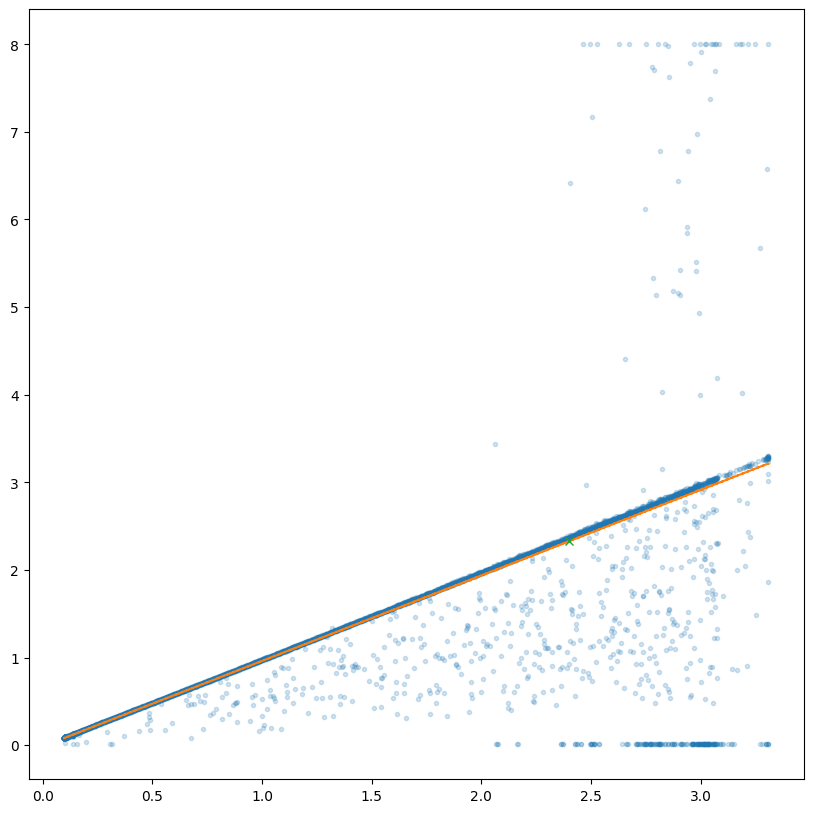

In [ ]:
cur_z = 2.4 
# 估计 2.4 V 距离为多少？

print(cur_z)
# gus1, gus2 = ambInvertH(cur_h, cur_z, mid=1)
# print(gus1)
plt.figure(figsize=(10, 10))
# plt.figure(figsize=(4, 3), dpi=150)
plt.plot(distance, sonar1, '.', alpha=0.2)
plt.plot(distance, sn1_model(distance,*filtered_params), '--')

try:
    plt.plot(g_sn1, sn1_model(g_sn1,*filtered_params),  'x-',linewidth = 12)
    print(g_sn1)
    print("估计电压值为", sn1_model(g_sn1,*filtered_params))
except:
    pass

## Likelihood?

In [ ]:
import numpy as np
N = lambda x, mean, var: np.exp(-0.5 *((x-mean)/var)**2)  / (var * np.sqrt(2*np.pi))


def VarError_LookUpTable2(x, error, xstep = 0.1):
    """
        x (长度): _description_
        error (拟合曲线的误差值): _description_
        xstep (分割精度): _description_. Defaults to 0.1.

    Returns:
        x 轴， 均值，方差值
    """
    curx = xstep
    curbar = np.array([])

    mean_x = np.array([])
    var_x = np.array([])
    xaxis = np.array([])

    for i in range(0, len(x)):
        
        if (x[i] < curx):
            
            curbar= np.append(curbar, error[i])
        else:
            # print(curbar)
            error_var = np.var(curbar)
            error_mean = np.mean(curbar)
            # print(f"variance: {error_var},  mean: {error_mean}")
            mean_x = np.append(mean_x, error_mean)
            var_x = np.append(var_x, error_var)
            xaxis = np.append(xaxis, x[i])
            curbar = np.array([])
            curx += xstep
    
    return xaxis, mean_x, var_x

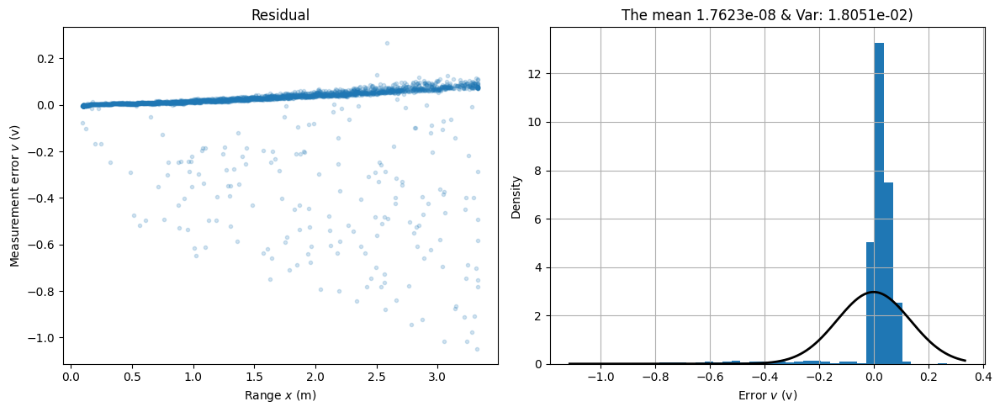

In [ ]:
import Model.IR_model as mm
sn1_x, sn1_v,sn1_fit,sn1_params= mm.remove_outlier(mm.sn1_model,distance,sonar1,0.7)
sn1_mu, sn1_std,ERR_sn1 = mm.Residual_and_Histogram(sn1_x,sn1_v,sn1_fit)
# ERR_sn1 = sonar1 - sn1_model(distance, *filtered_params)
# print(sn1_params)

[0.00527725 0.02136412 0.01981733 0.02897155 0.02755217 0.01923059
 0.01394771 0.01296746 0.01832536 0.01919307 0.02097799 0.01424739
 0.01914742 0.01483707 0.01662083 0.01755575 0.01377127 0.01877715
 0.01363273 0.01849532 0.01908382 0.02182455 0.02096705 0.01921889
 0.02239554 0.02392075 0.02346749 0.02762507 0.02953042 0.03428611
 0.03066126 0.03347484 0.03090547]


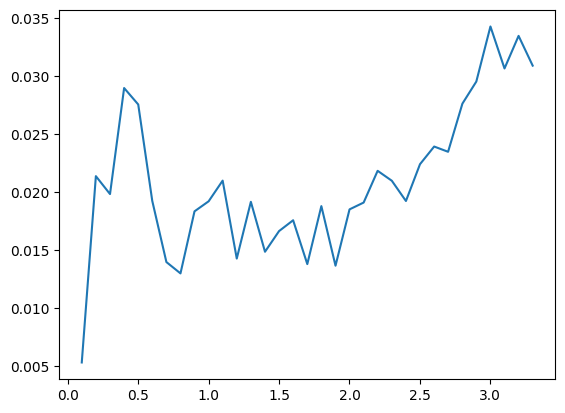

In [ ]:
Xaxis_sn1, Mu_X_sn1, std_X_sn1 = VarError_LookUpTable2(ir1_x, err_ir1)
''' Input: x, error, step  '''
# plt.figure()
# plt.plot(Xaxis_sn1,Mu_X_sn1)
plt.plot(Xaxis_sn1,std_X_sn1)
print(std_X_sn1)

2.474777521178993


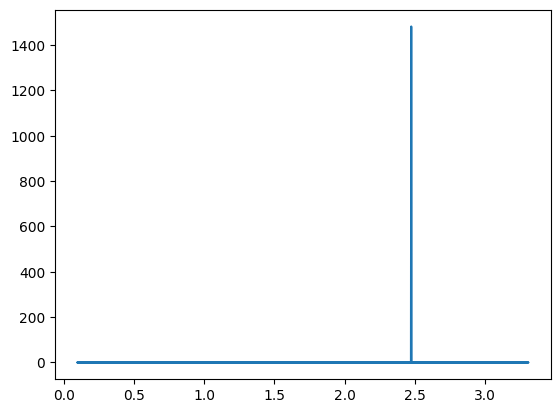

In [ ]:
def find_std_index(value, intervals):
    """
    根据给定的值和区间，找到该值所在的区间索引。

    参数：
    - value：要查找区间的值。
    - intervals：包含区间的NumPy数组。假定区间是已排序的。

    返回：
    - interval_index：值所在的区间索引。如果值小于第一个区间下限，返回0。
      如果值大于最后一个区间上限，返回len(intervals) - 1。
    """
    if value < intervals[0]:
        return 0
    if value >= intervals[-1]:
        return len(intervals) - 1
    for i in range(len(intervals) - 1):
        if value >= intervals[i] and value < intervals[i + 1]:
            return i
    return -1  # 如果值不在任何区间内，则返回-1

# 区间
# 找到给定值所在的区间索引
# val_sn1 = 2.4
interval_index = find_std_index(g_sn1, Xaxis_sn1)
# print(interval_index)

# print(Xaxis_sn1[interval_index+1])
# print(val_sn1)



# g1= invertH(h_sn1, sonar1[find_sonar1_index])
g1 = H_INV_sn1(sonar1[find_sonar1_index])
print(g1)
err_var_sn1 = std_X_sn1[interval_index] ** 2;
# # 输入距离，给出电压。
L_sn1 = N(distance, g1,  err_var_sn1)#err_var_sn1


sonarPlot = plt.plot(distance, L_sn1)


# print(f"sonar guess {sonar1[find_sonar1_index]}")
# # print(f"area = {np.trapz(L_sn1, x_region, dx = 0.02)}"

    